# 1. Building Environment & Data Awareness

## 1.1 Building Environment

### 1.1.1 Download All libraries that will be uses in this code and update -pip

In [1]:
%pip install --upgrade pip
%pip install pyshp
%pip install pandas
%pip install geopandas
%pip install numpy
%pip install matplotlib
%pip install shapely
%pip install random2
%pip install scikit-learn
%pip install seaborn
%pip install kneed
%pip install statsmodels
%pip install --upgrade kneed

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


### 1.1.2 Import all libraries

In [2]:
from shapely.geometry import Point, Polygon
from geopandas import GeoSeries
import shapefile
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import statsmodels.api as sm


######## DBSCAN ###################
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from collections import Counter
from kneed import KneeLocator
import seaborn as sns
from statsmodels.formula.api import ols
from sklearn.cluster import OPTICS

### 1.1.3 Initialize Variables

In [3]:
#Catch the main Root
Root_Main = os.path.abspath("")

#Insert the input folders and files
File = Root_Main+ r'\1. Analysis\1. P33\0. Raw Data\Data.zip'
Parent_Dir = Root_Main+'\\1. Analysis\\2. Field\\'

DataFrames_Folder = Parent_Dir+'1. DataFrames Data'
Points_Folder = Parent_Dir+'2. Points Folder'
Clusters_Folder = Parent_Dir+'3. OutPut Clusters'
Images_Folder = Parent_Dir+'4. Images'


Point_Cloud_Density_Denominator = [3,5,7,11,30,50,70,110,300,500,700,1100]
Point_Cloud_Pattern = ['Hx' ,'Rd','Hx']

#Initialize internall Variables
geodata = gpd.read_file(File).explode(index_parts=True)


### 1.1.4 Create folder in data File and check if that already exist

In [4]:
#Creating output folders
Folders = ['1. DataFrames Data','2. Points Folder','3. OutPut Clusters','4. Images']

for i in range(len(Folders)):
    Folder = Folders[i]
    try:
        os.mkdir(Parent_Dir+Folder)
    except:
     pass

## 1.2 Data Awareness

### 1.2.1 Data Examples

### 1.2.2 First 5 rows

In [5]:
geodata.head()

,,ID,AREA_TOTAL,igds_level,FEICAO,geometry
0,0,2,7179.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((393146.814 7532349.248, 393126.401 7..."
1,0,3,846.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((382167.545 7509813.859, 382173.963 7..."
2,0,4,48872.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((392963.515 7532349.132, 392968.996 7..."
3,0,5,2202.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((383312.992 7509814.708, 383312.992 7..."
4,0,6,2646.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((398400.045 7530666.762, 398392.886 7..."


### 1.2.3 Convert UTM Easting => Radians

### 1.2.4 Square Plot Map

<Axes: >

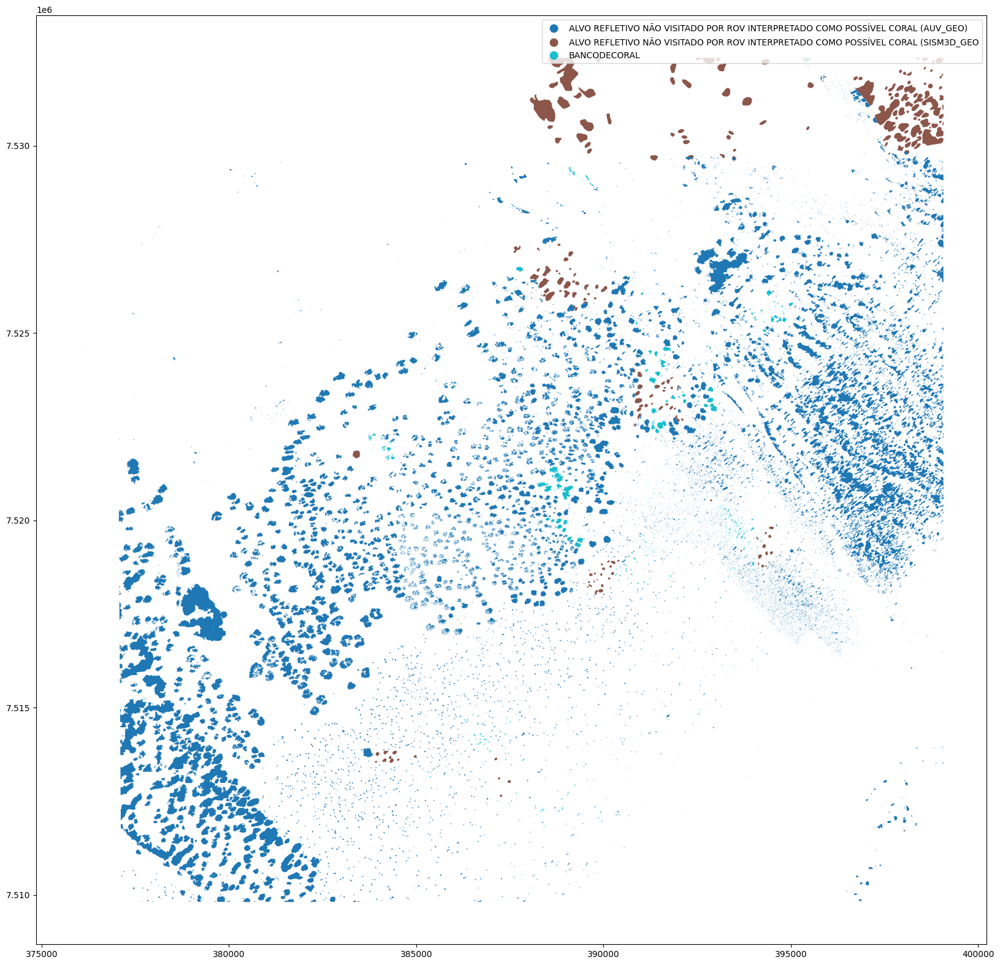

In [6]:
# Adjust the aspect ratio manually to reflect a 1:100 scale
aspect_ratio = 10

geodata.plot(figsize=(20, 20) 
             
             #,column='ID_AREA'               
             ,column='igds_level'               
             #,cmap='OrRd'\
             ,legend=True
            ,aspect='equal'  # Mantém a proporção dos eixos igual
            #,aspect=aspect_ratio   # Adjust aspect ratio to match 1:100 proportion
            )


F-statistic: O valor do teste F. Quanto maior o valor, maior a chance de que pelo menos um dos grupos seja diferente.
P-value: Se o p-valor for menor que o nível de significância (geralmente 0,05), você pode rejeitar a hipótese nula de que todas as médias dos grupos são iguais.

#### 1.2.4 Basic Statistics

In [7]:
df = geodata

# Get basic statistics
stats = df['AREA_TOTAL'].agg([
                                'count'
                                , 'sum'
                                , 'mean'
                                , 'median'
                                , 'std'
                                , 'var'
                                , 'min'
                                , 'max'
                                , lambda x: x.quantile(0.25)
                                , lambda x: x.quantile(0.50)
                                , lambda x: x.quantile(0.75)])

# Format the results with thousand separators
formatted_stats = stats.apply(lambda x: f"{x:,.0f}")

# Display results
print(formatted_stats)

count            29,836
sum          40,994,040
mean              1,374
median               80
std              11,157
var         124,467,985
min                   0
max           1,001,033
<lambda>             34
<lambda>             80
<lambda>            309
Name: AREA_TOTAL, dtype: object


In [8]:
df = geodata

print('Data grouped by Feição')

df_grouped = df.groupby('FEICAO')['AREA_TOTAL'].sum()
df_grouped = df_grouped.apply(lambda x: int(x))
print(df_grouped)

df_grouped = df.groupby('FEICAO')['AREA_TOTAL'].count()
df_grouped = df_grouped.apply(lambda x: int(x))
print(df_grouped)

print('Data grouped by igds_level')

df_grouped = df.groupby('igds_level')['AREA_TOTAL'].sum()
df_grouped = df_grouped.apply(lambda x: int(x))
print(df_grouped)

df_grouped = df.groupby('igds_level')['AREA_TOTAL'].count()
df_grouped = df_grouped.apply(lambda x: int(x))
print(df_grouped)

Data grouped by Feição
FEICAO
Alvos Refletivos        39938656
Banco de Coral            823923
Bancos de Coral Víde      231461
Name: AREA_TOTAL, dtype: int64
FEICAO
Alvos Refletivos        27057
Banco de Coral           1022
Bancos de Coral Víde     1757
Name: AREA_TOTAL, dtype: int64
Data grouped by igds_level
igds_level
ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETADO COMO POSSÍVEL CORAL (AUV_GEO)      36117031
ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETADO COMO POSSÍVEL CORAL (SISM3D_GEO     3821625
BANCODECORAL                                                                         1055384
Name: AREA_TOTAL, dtype: int64
igds_level
ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETADO COMO POSSÍVEL CORAL (AUV_GEO)      26845
ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETADO COMO POSSÍVEL CORAL (SISM3D_GEO      212
BANCODECORAL                                                                         2779
Name: AREA_TOTAL, dtype: int64


#### 1.2.5 ANOVA for AREA_TOTAL and FEICAO

Null hypotese: All Means are equal

In [9]:
df = geodata

# Criar o modelo ANOVA usando a fórmula: valor ~ C(grupo)
model = ols('AREA_TOTAL ~ C(FEICAO)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

# Show ANOVA Results
print(anova_table)

# Catch p value
p_value = anova_table["PR(>F)"]["C(FEICAO)"]

# Show p value
print(f'P-value: {p_value}')

##F-statistic: The value of the F-test. The higher the value, the greater the chance that at least one of the groups is different.
##P-value: If the p-value is less than the significance level (usually 0.05), you can reject the null hypothesis that all the group means are equal.

                 sum_sq       df          F    PR(>F)
C(FEICAO)  3.322956e+09      2.0  13.359698  0.000002
Residual   3.710179e+12  29833.0        NaN       NaN
P-value: 1.5869152778996424e-06


In [10]:
df = geodata

# Sort the data by the 'AREA_TOTAL' column in descending order
df = df.sort_values(by='AREA_TOTAL', ascending=False)

df

,,ID,AREA_TOTAL,igds_level,FEICAO,geometry
301,0,303,1001033.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((379397.264 7517581.816, 379396.519 7..."
289,0,291,662811.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((379242.807 7512949.702, 379242.678 7..."
27001,0,27003,525005.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((377100.858 7513941.645, 377101.687 7..."
3734,0,3736,472181.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((377489.015 7516765.446, 377489.153 7..."
314,0,316,467750.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((392933.186 7526036.900, 392924.414 7..."
...,...,...,...,...,...,...
14646,0,14648,0.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((386461.668 7513288.209, 386461.769 7..."
14903,0,14905,0.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((386325.485 7518557.453, 386325.511 7..."
14659,0,14661,0.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((385427.857 7517131.083, 385427.993 7..."
23022,0,23024,0.0,ALVO REFLETIVO NÃO VISITADO POR ROV INTERPRETA...,Alvos Refletivos,"POLYGON ((393695.590 7525348.804, 393695.603 7..."


In [11]:
df.to_csv('Alvos_Reflexivos_Csv.csv', index=False)

#### 1.2.6 Pareto Graphs

Number of items needed to reach 80%: 1630


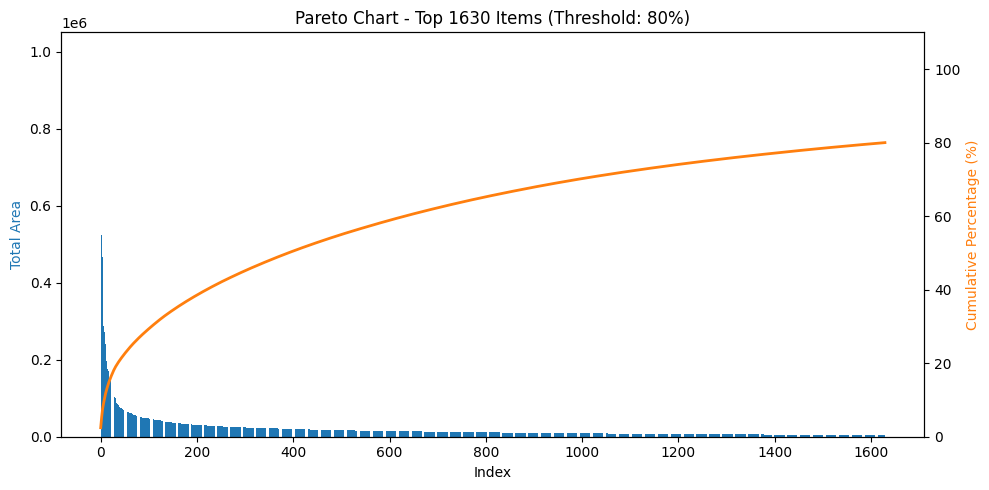

In [12]:
df = geodata

# Sort the data by the 'AREA_TOTAL' column in descending order
df = df.sort_values(by='AREA_TOTAL', ascending=False)

# Calculate the cumulative percentage
df['perc_acumulada'] = df['AREA_TOTAL'].cumsum() / df['AREA_TOTAL'].sum() * 100

# Find how many items are needed to reach 80% of the total
threshold = 80  # Set the Pareto threshold, e.g., 80%
items_to_80_percent = df[df['perc_acumulada'] <= threshold].shape[0]

print(f"Number of items needed to reach {threshold}%: {items_to_80_percent}")

# Optimize: Only show the top N items
top_n = max(items_to_80_percent, 50)  # Show at least 50 or up to the threshold
df_top = df.head(top_n).reset_index(drop=True)  # Reset index and drop the old one

# Plot Pareto chart with performance optimizations
fig, ax1 = plt.subplots(figsize=(10, 5))  # Moderate figure size for performance

# Plot bars for the top N items using the new index
ax1.bar(df_top.index, df_top['AREA_TOTAL'], color='C0')
ax1.set_xlabel('Index')
ax1.set_ylabel('Total Area', color='C0')

# Plot cumulative percentage line on the secondary y-axis (without markers for performance)
ax2 = ax1.twinx()
ax2.plot(df_top.index, df_top['perc_acumulada'], color='C1', lw=2)  # Removed markers for speed
ax2.set_ylabel('Cumulative Percentage (%)', color='C1')

# Final adjustments
plt.title(f'Pareto Chart - Top {top_n} Items (Threshold: {threshold}%)')
ax2.set_ylim([0, 110])  # Set limit from 0 to 100% for the cumulative percentage

# Optimize layout for faster rendering
plt.tight_layout()

# Show plot
plt.show()

# 2. Building Functions

### 2.1 Create a list of coordinates with the points of a polygon

In [6]:
# # Criar uma lista de coordenadas com os pontos de um polygono

#######################Gerando os pontos de um polygono com as informações extraídas
def Poly(poligono):
    #extraindo o respectivo polygono

    # Extract the point values that define the perimeter of the polygon
    xx, yy = poligono.exterior.coords.xy #Extra;áo dos vertices que definem o perímetro,valores do tipo matriz
    point = []
    
    for i in range(len(xx)):
        point += [[xx[i]]+[yy[i]]]
    return point

### 2.2 Create a Cloud Points inside the Polygn

In [7]:
def Points_in_Bounds(polygon, number, switch):
    try:
        ################RANDOM###############################  
        # Extract the boundary (exterior) of the polygon
        boundary = polygon.exterior
        boundary_length = boundary.length

        # Calculate the cumulative distance along the boundary
        distances = np.linspace(0, boundary_length, number)

        # Find points at equally spaced intervals along the boundary
        points = [boundary.interpolate(distance) for distance in distances]
            
        # Extract x and y coordinates of the boundary points
        a = list([point.x for point in points])
        b = list([point.y for point in points])
            
        if switch == 'Rd':
            ################RANDOM############################### 
            print("Random") 
            minx, miny, maxx, maxy = polygon.bounds
            x = np.random.uniform( minx, maxx, number )
            y = np.random.uniform( miny, maxy, number )
            
        elif switch == 'Eq':
            ################Equidistante############################### 
            minx, miny, maxx, maxy = polygon.bounds

            x = [minx,maxx]
            y = [miny,maxy]

            Square = int(number**0.5)
            
            StepX = (maxx-minx)/Square
            StepY = (maxy-miny)/Square #sqrt(3)/2 * StepX

            for i in range(Square):
                for j in range(int(number**0.5)):
                    x=x+[minx+(i)*StepX]
                    y=y+[miny+(j)*StepY]
            #return x, y
        else:
            ################HEXAGONAL###############################  
            minx, miny, maxx, maxy = polygon.bounds
            #print(miny,maxy)

            x = [minx,maxx]
            y = [miny,maxy]

            Square = int(number**0.5)
            
            StepX = (maxx-minx)/Square
            StepY = (maxy-miny)/Square

            for i in range(Square):
                for j in range(int(number**0.5)):
                    if j%2 == 0:
                        x = x+[minx+(i)*StepX*2]
                        y = y+[miny+(j)*StepY]
                    else:
                        x = x+[(minx+(i)*StepX)+StepX/2]
                        y = y+[miny+(j)*StepY]
            #return x, y
        #x = np.concatenate((x, a))
        #y = np.concatenate((y, b))
        
        
        return x, y
    except:
        # Get a point guaranteed to be inside the polygon
        inside_point = polygon.representative_point()

        # Store the x and y coordinates of the centroid in a list
        x = list([inside_point.x])
        y = list([inside_point.y])
        
        return x,y
        
        

### 2.3 Sample of Polygons with Points

8159


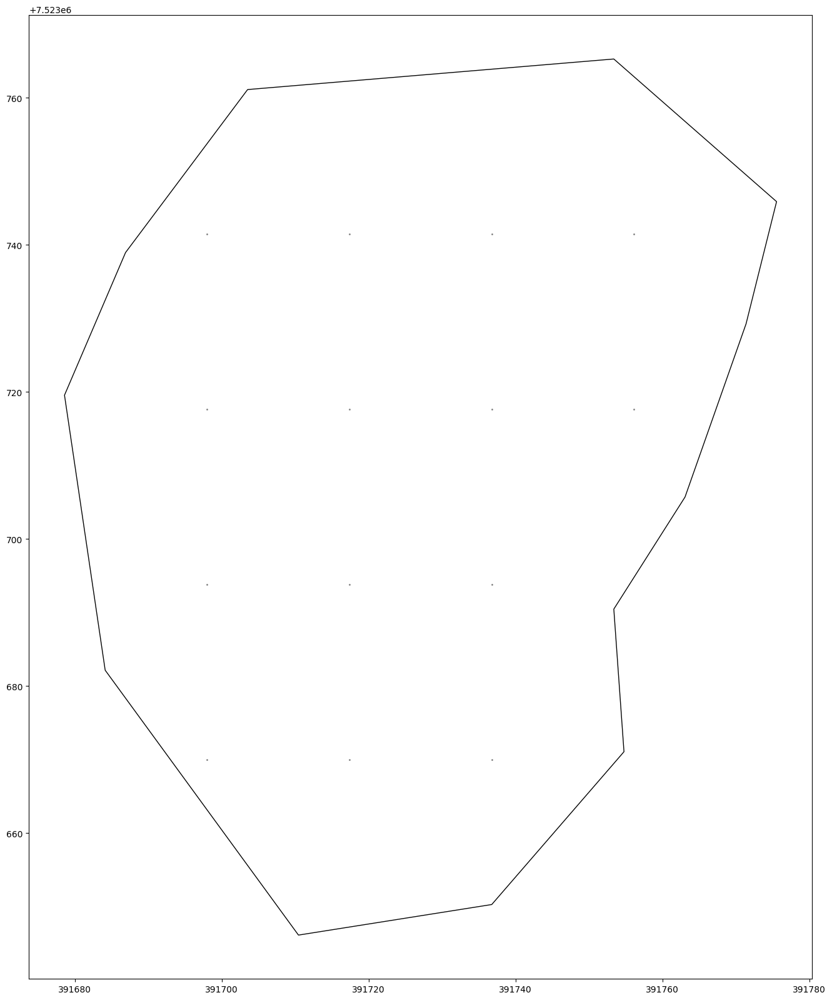

In [27]:
#########Visualização dos polígonos################
n = 8 #Number of the Polygon
Density = 1/300 #Density
print(geodata['AREA_TOTAL'].iloc[n].astype(int))
Type = 'Eq' #['Eq','Rd','Hx']

polygon = Polygon(Poly(geodata.iloc[n].geometry))
gdf_poly = gpd.GeoDataFrame(index=["myPoly"], geometry=[polygon])


x,y = Points_in_Bounds(polygon, int(geodata['AREA_TOTAL'].iloc[n].astype(int)*Density),Type)
#x,y = x[0],y[0]
#print(Points_in_Bounds(polygon, int(geodata['AREA_TOTAL'].iloc[n].astype(int)*Density),Type))
#x,y = Points_in_Bounds(polygon, 0,Type) ## Analysing the execption

df = pd.DataFrame()
df['points'] = list(zip(x,y))
df['points'] = df['points'].apply(Point)
gdf_points = gpd.GeoDataFrame(df, geometry='points')

Sjoin = gpd.tools.sjoin(gdf_points, gdf_poly, how='left')

# Keep points in "myPoly"
pnts_in_poly = gpd.sjoin(gdf_points, gdf_poly, how='inner')

# Plot result
base = gdf_poly.boundary.plot(linewidth=1, edgecolor="black")
pnts_in_poly.plot(figsize=(20, 20) ,ax=base, linewidth=1, color="grey", markersize=1,aspect='equal')
plt.show()

# 3. Manipulate Data

## 3.1 Extract and Transform Data

### 3.1.1 Populate the Geodata with Points

In [31]:
#################### GERANDO MALHA DE PONTOS ########################
Error = []
for i in Point_Cloud_Density_Denominator:
    for k in Point_Cloud_Pattern:
        for j in range(geodata['geometry'].count()):
        #for j in range(4):
            try: 
                ######Creating Polygon DataFrame   ######
                polygon = Polygon(Poly(geodata.iloc[j].geometry))
                gdf_poly = gpd.GeoDataFrame(geometry=[polygon])

                ##### Create points DataFrame ######
                x,y = Points_in_Bounds(polygon,int(geodata['AREA_TOTAL'].iloc[j].astype(int)/i),k)
                df = pd.DataFrame()
                df['points'] = list(zip(x,y))
                df['points'] = df['points'].apply(Point)
                gdf_points = gpd.GeoDataFrame(df, geometry='points')
                
                ##### Union and exclude points out of the Polygn ######
                Sjoin = gpd.tools.sjoin(gdf_points, gdf_poly, how='left')
                pnts_in_poly = gpd.sjoin(gdf_points, gdf_poly, how='inner')
                #print(geodata)
                try:
                    pnts_in_poly = pnts_in_poly.rename(columns={'index_right': 'ID'}) 
                except:
                    pass
                
                try:
                  pnts_in_poly = pnts_in_poly.rename(columns={'ID_ALVOS': 'ID'})
                except:
                    pass
                
                try:
                    pnts_in_poly['ID'] = geodata['ID'].iloc[j][0]
                except:
                    pnts_in_poly['ID'] = geodata['ID_ALVOS'].iloc[j]
                
                if j == 0:
                    Points = pnts_in_poly
                else:
                    Points = pd.concat([Points, pnts_in_poly])
            except: 
                Error = [j]
                Errors = open(Parent_Dir+'\\'+"Fail.txt", "a")
                Errors.writelines(str(Error[0])+"\n")
                Errors.close()
                
        
        name = DataFrames_Folder+'\\'+str(k+"-"+str(i)+".shp")
        print(Points)
        Points.to_file(name)
        Malhas = open(Parent_Dir+'\\'+"1. Point cloud.txt", "a")
        Malhas.writelines(name+"\n")
        Malhas.close()
        Points = Points.iloc[0:0]

                            points ID
1   POINT (393146.814 7532349.248)  2
68  POINT (393010.707 7532289.618)  2
69  POINT (393010.707 7532291.605)  2
70  POINT (393010.707 7532293.593)  2
71  POINT (393010.707 7532295.581)  2
..                             ... ..
0   POINT (393261.285 7519653.805)  2
0   POINT (393474.271 7519635.409)  2
0   POINT (393434.916 7519655.235)  2
0   POINT (393495.186 7519543.363)  2
0   POINT (393334.929 7519721.052)  2

[6806912 rows x 2 columns]
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Random
Rando

### 3.1.2 Parameterize geodata points before cluster

In [11]:
Malhas = open(Parent_Dir+'\\'+"1. Point cloud.txt", "r+")
Arquivo = Malhas.readlines()
for i in range(len(Arquivo)):
    Arquivo[i] = Arquivo[i].replace("\n","")
Malhas.close()

for i in range(len(Arquivo)):
    #Abrindo todos os arquivos
    gdf = gpd.read_file(Arquivo[i])
    
 
 
    #Criando o nome do arquivo
    name,x = '',''
    x = Arquivo[i].split("\\")
    name= Points_Folder+"\\Coordinates - "+x[-1].replace('.shp','.txt')
    Coordenadas = open(Parent_Dir+"2. Point cloud - Parameterized Data.txt", "a")
    Coordenadas.writelines(name+"\n")
    Coordenadas.close()
    # Extract the point values that define the perimeter of the polygon
    Data = open(name,'a')
    Data.writelines("Latitude, Longitude, ID\n")
    for j in range(gdf['geometry'].count()):
        xx, yy = gdf.iloc[j].geometry.coords.xy #Extra;áo dos vertices que definem o perímetro,valores do tipo matriz
        Data.writelines(str(xx[0])+','+str(yy[0])+','+str(gdf.iloc[j][0])+'\n') 
    Data.close()

KeyboardInterrupt: 

### 3.1.3 DBSCAN

14.692198482982349


<Figure size 640x480 with 0 Axes>

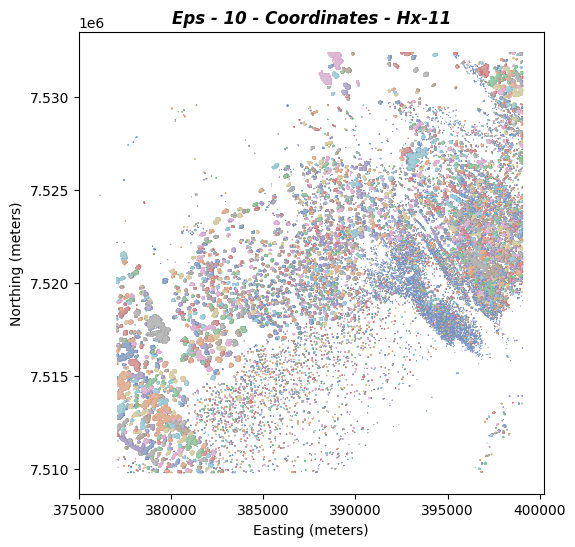

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

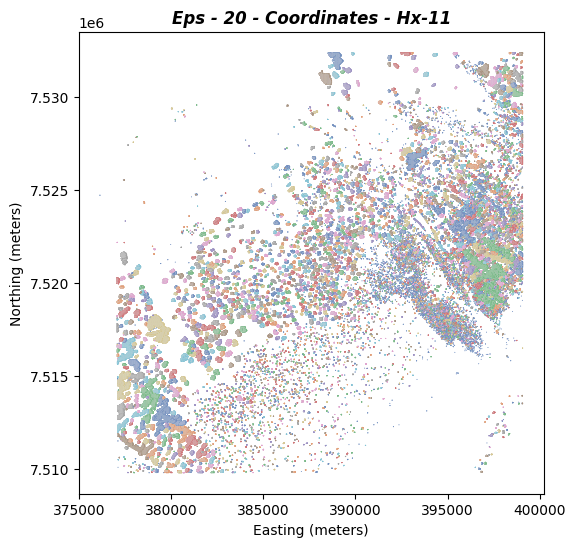

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

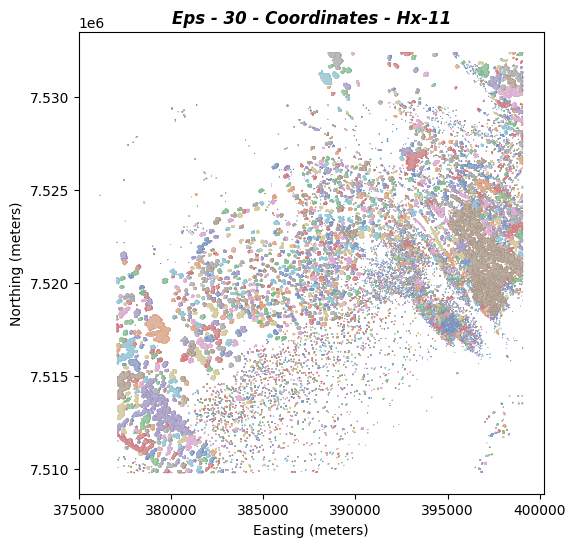

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

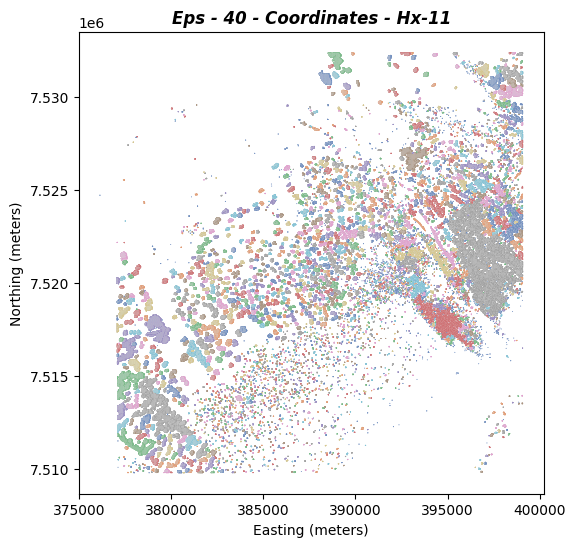

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

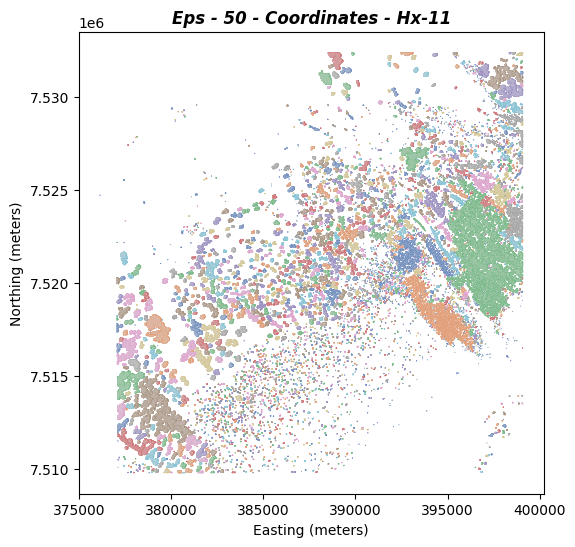

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

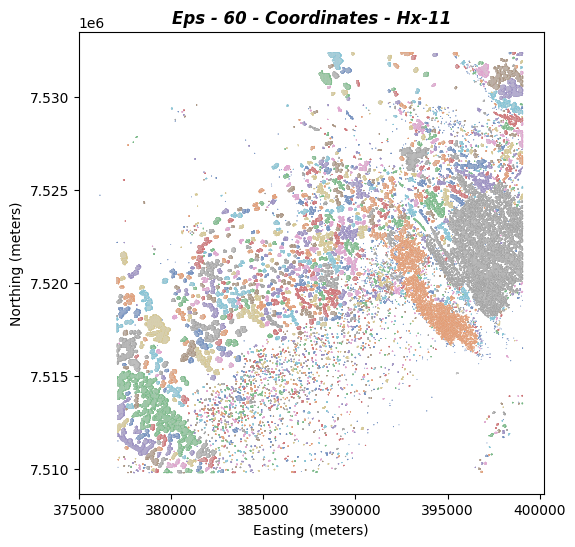

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

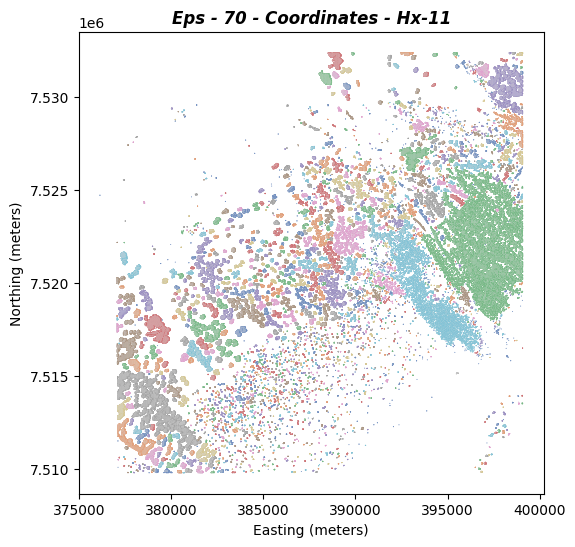

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

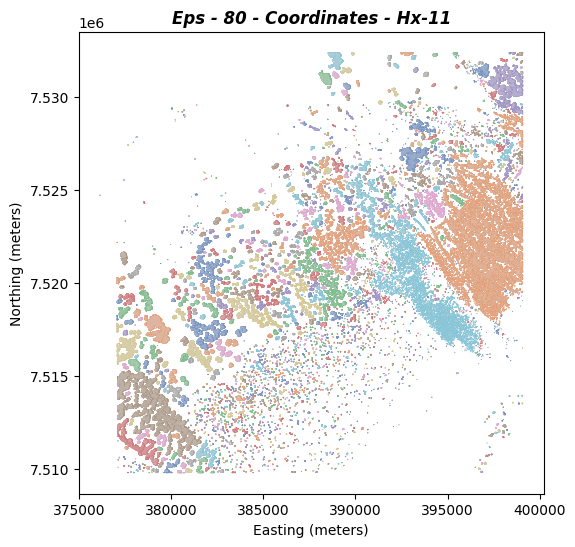

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

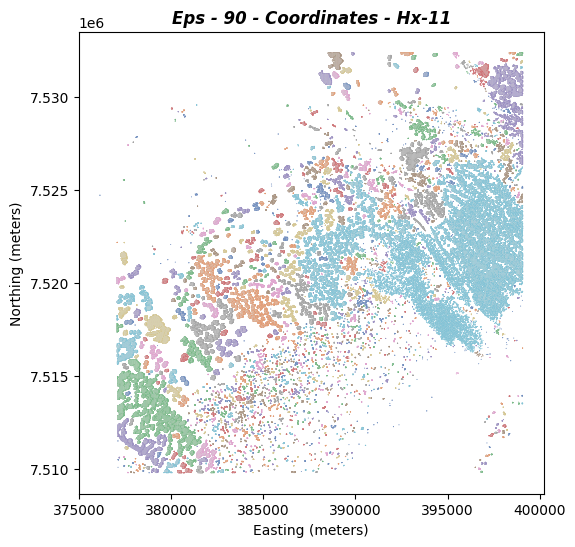

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

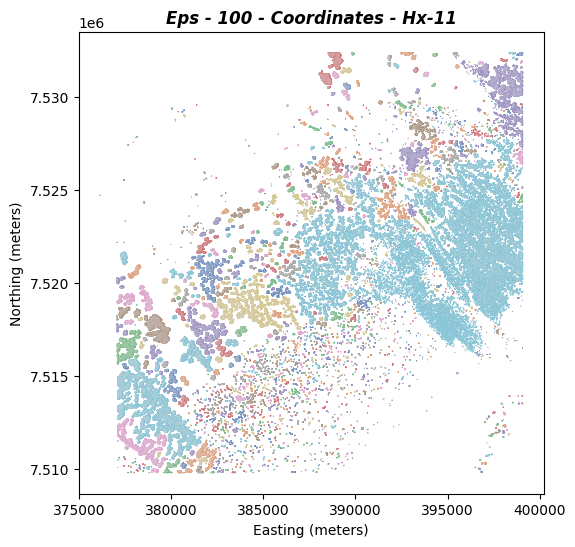

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

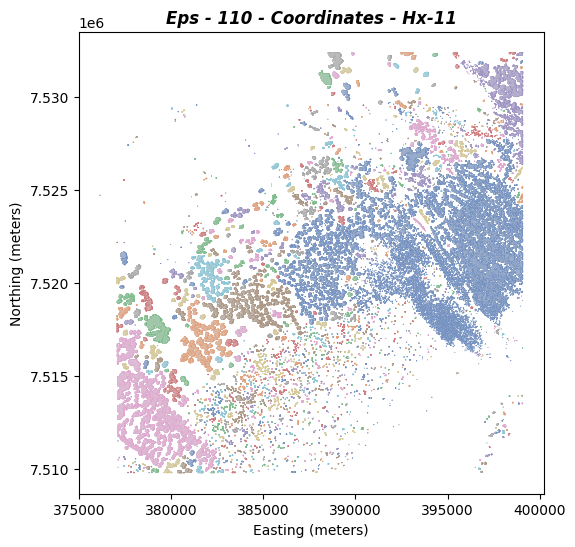

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt
14.692198482982349


<Figure size 2000x2000 with 0 Axes>

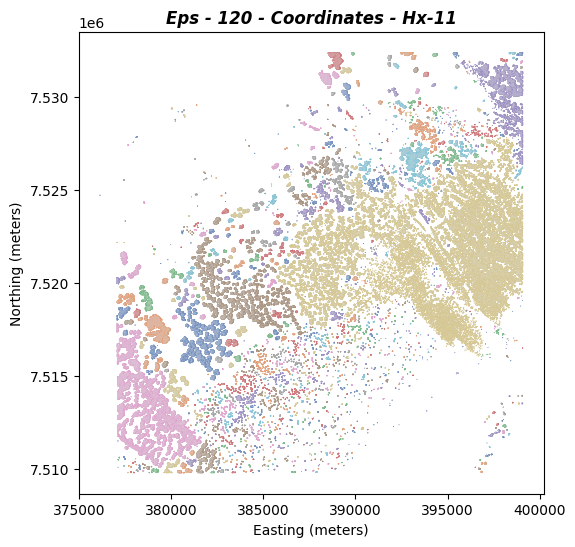

d:\TCC - Severino Virgínio\1. Analysis\2. Marlim\2. Points Folder\Coordinates - Hx-11.txt


In [30]:
Input = open(Parent_Dir+"2. Point cloud - Parameterized Data.txt", "r+")
Entrada = Input.readlines()
for i in range(len(Entrada)):
    Entrada[i] = Entrada[i].replace("\n","")
Input.close()

for j in range(len(Entrada)):
    for multi in range(1,13):
        #try:
            # Como os parametros são muito sensíveis, utilizar um KNN para encontrar o primeiro valor de eplison parece ser razoável
            # https://www.reneshbedre.com/blog/dbscan-python.html 

            #definindo dataframe
            df = pd.read_csv(Entrada[j],low_memory=False)
            del df[' ID']
            
            #Lista de palavras do diretório
            x = Entrada[j].split("\\")

            #Encontrando o valor do Eps razoável, já que graficamente seria muito limitado
            nearest_neighbors = NearestNeighbors(n_neighbors=11)
            neighbors = nearest_neighbors.fit(df)

            distances, indices = neighbors.kneighbors(df)
            distances = np.sort(distances[:,10], axis=0)

            i = np.arange(len(distances))
            knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

            #Plotando o gráfico
            plt.clf() #limpando o gráfico
            plt.rcdefaults() #garantindo que está no modo default
            plt.rcParams.update({'font.size': 12})
            knee.plot_knee()
            plt.xlabel("Points")
            plt.ylabel("Distance")

            #Guardando a variável Eps que será aplicada ao DBSCAN
            Epsilon = multi*10#distances[knee.knee]*2**multi
            
            plt.title('Epsilon - '+str(round(Epsilon,2))+' - '+x[-1].replace('.txt',' ').replace('Coordenadas - ',''))
            
            #Salvado a imagem
            name= Images_Folder+"\\1. KneePoint - Eps - "+str(round(Epsilon,2))+' - '+x[-1].replace('.txt','.png').replace('Coordenadas - ','')
            plt.savefig(name)

            #printando o valor
            print(distances[knee.knee])
            
            #Limpando a Imagem
            plt.clf()

            #OPTICS()
            #clusters = OPTICS(eps=Epsilon, min_samples=4,algorithm='kd_tree').fit(df) #boa prática para min seria R *2, no caso 4 unidades, como está densamente povoado
            clusters = DBSCAN(eps=Epsilon, min_samples=4,algorithm='auto').fit(df) #boa prática para min seria R *2, no caso 4 unidades, como está densamente povoado

            plt.rcdefaults() #garantindo que está no modo default
            myDictionary = Counter(clusters.labels_)
            plt.rcParams["figure.figsize"] = (15,3)
            plt.bar(list(myDictionary.keys()), myDictionary.values(), color='b')

            #Legendas dos eixos
            plt.xlabel("Cluster")
            plt.ylabel("Qtd.")

            #Zerando margem
            plt.margins(x=0)
            name= Images_Folder+"\\2. Qtd por Cluster - Eps - "+str(round(Epsilon,2))+' - '+x[-1].replace('.txt','.png').replace('Coordenadas - ','')
            plt.title(label="Eps: "+str(round(Epsilon,2))+' - '+x[-1].replace('.txt','.').replace('Coordenadas - ',''), 
                      fontweight=10,
                      fontstyle='oblique'
                     )
            #Salvado a imagem
            plt.savefig(name)
            #plt.show()
            #Limpando a imagem
            plt.clf()
            
            plt.rcdefaults() #garantindo que está no modo default
            p = sns.scatterplot(data=df,s=0.5, x="Latitude", y=" Longitude", hue=clusters.labels_, legend=False, palette="deep",)
            plt.rcParams.update({'font.size': 10})
            plt.rcParams["figure.figsize"] = (20,20)
            #sns.move_legend(p, "upper right", bbox_to_anchor=(1.17, 1.2), title='Alvos Reflexivos')
            plt.title(label="Eps - "+str(round(Epsilon,2))+' - '+x[-1].replace('.txt','').replace('Coordenadas - ',''), 
                      fontweight='bold',
                      fontstyle='oblique'
                      )
            plt.xlabel("Easting (meters)")  # Rótulo do eixo X
            plt.ylabel("Northing (meters)") 
            #plt.gca().set_aspect('equal')
            #Salvado a imagem
            name= Images_Folder+"\\3. Mapa - DBSCAN. - Eps - "+str(round(Epsilon,2))+' - '+x[-1].replace('.txt','.png').replace('Coordenadas - ','')
            plt.savefig(name, dpi=720)
            plt.show()

            #Inserindo o nome e caminho do arquivo em um arquivo txt
            name= Clusters_Folder+"\\Clusters - Eps - "+str(round(Epsilon,2))+' - '+x[-1].replace('.shp','.csv').replace('Coordenadas - ','')
            Coordenadas = open("3. Clusters - DBSCAN.txt", "a")
            Coordenadas.writelines(name+"\n")
            Coordenadas.close()

            #Adicionando número do cluster ao arquivo original
            df2 = pd.read_csv(Entrada[j])
            df2['Cluster']= list(clusters.labels_)
            df2.to_csv(name, index=False)
        #except:
            print(Entrada[j])
            
            
            